# pyfabric example 04: 3D register QCT to HR-pQCT dataset

Created on:  16.06.2025 <br />
Last update: 02.07.2025 <br />

- By: [Gianluca Iori](https://github.com/gianthk), 2024
- Data source: QCT and HR-pQCT datasets were collected within the ANR-DFG TaCoSound project.
- Code license: MIT
- Narrative license: CC-BY-NC-SA

---
## Aims
1. Load and inspect QCT and HR-pQCT datasets of the proximal femur using simpleITK
2. detect alignment cement markers on QCT image
3. resample QCT dataset to isotropic voxel size
4. apply median filter to QCT dataset
5. compute transformation matrices for QCT to HR-pQCT image registration
6. apply 3D affine registration transformation to register QCT data to HR-pQCT

---
## Configuration and imports

In [1]:
import os
import sys

In [3]:
# # gianthk@thkdebian
# sys.path.append('/home/gianthk/PycharmProjects/pyfabric')
# sys.path.append('/home/gianthk/PycharmProjects/BEATS/recon_utils')

In [2]:
# terminus
sys.path.append('/usr/terminus/data-xrm-01/stamplab/users/giiori/code/pyfabric')
sys.path.append('/usr/terminus/data-xrm-01/stamplab/users/giiori/code/ORMIR_XCT')
sys.path.append('/usr/terminus/data-xrm-01/stamplab/users/giiori/code/recon_utils')

In [3]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import skimage.io as io
from skimage.filters import threshold_multiotsu
from skimage import morphology
from skimage.measure import label, regionprops, regionprops_table
import heapq
import pandas as pd
import SimpleITK as sitk

from imaging_utils import periosteummask
from resources.myshow import myshow, myshow3d
from recon_utils import plot_midplanes, plot_projections
import pyfabric
from resources.pyfabric_image_utils import dist_table, markers_coors, resample_img, vectors2rotation3Dmatrix, align_with_XYplane, align_with_vectors, resample, affine_trans

astropy module not found
olefile module not found


In [4]:
matplotlib.rcParams['figure.dpi'] = 300

font = {'weight' : 'normal',
        'size'   : 6}

plt.rc('font', **font)

In [5]:
%%html
<style>
table {float:left}
</style>

## Functions definition

In [ ]:
def plot_midplanes_sitk(img):
    plot_midplanes(sitk.GetArrayFromImage(img))

def plot_projections_sitk(img):
    plot_projections(sitk.GetArrayFromImage(img))

## Computational workflow
### Settings

In [ ]:
# # gianthk@thkdebian
# work_dir = '/home/gianthk'
# data_dir = '/media/gianthk/My Passport/Data/TacoSound'

In [7]:
# terminus
data_dir = "/usr/terminus/data-xrm-01/stamplab/external/tacosound/" #base-path where .mhd and .raw file is located
work_dir = '/usr/terminus/data-xrm-01/stamplab/users/giiori/2025/2025-06_supertrab_registration/'

In [12]:
output_dir = data_dir 

target_folders = [
    "1955_L",
    "1956_L",
    "1996_R",
    "2005_L",
    "2007_L",
    "2019_L"
]

isqnames = [
    "C0001577",
    "C0001577",
    "C0001577",
    "C0001577",
    "C0001577",
    "C0001524"
]

specimen_id = 5 # 2019_L

specimen = target_folders[specimen_id]
isqname = isqnames[specimen_id]
master_filename = 'tacosound_master_all.csv'
master_filename = os.path.join(data_dir, master_filename)

input_file_HR = os.path.join(data_dir, 'HR-pQCT_II/00_resampled_data', specimen, isqname, '.ISQ')
input_file_HR_res = os.path.join(data_dir, 'HR-pQCT_II/00_resampled_data', specimen, (isqname + '_processed.mhd'))

input_dir_QCT_DCM = os.path.join(data_dir, 'QCT/', ('QCTFEMUR_' + specimen.replace("_", "")), 'Q_CT_DIAGBILANZ_HR_0003') # load the original DICOM files (contain misalignmed slices)
print("input_dir_QCT_DCM:", input_dir_QCT_DCM)

input_file_QCT_fixed = os.path.join(data_dir, 'QCT', ('QCTFEMUR_' + specimen.replace("_", "")), (specimen + '_3Dslicer.mhd'))
print("input_file_QCT_fixed:", input_file_QCT_fixed)

# input_file_QCT = work_dir + '/Data/TacoSound/QCT/QCTFEMUR_2019L/slices/slice_0000.tif'

input_dir_QCT_DCM: /usr/terminus/data-xrm-01/stamplab/external/tacosound/QCT/QCTFEMUR_2019L/Q_CT_DIAGBILANZ_HR_0003
input_file_QCT_fixed: /usr/terminus/data-xrm-01/stamplab/external/tacosound/QCT/QCTFEMUR_2019L/2019_L_3Dslicer.mhd


### Read and inspect HR-pQCT input data

#### ! For the moment we use resampled data !

In [13]:
data_3D_res = sitk.ReadImage(input_file_HR_res, imageIO="MetaImageIO")

In [14]:
# print out the usual SimpleITK image characteristics
print (data_3D_res.GetSize())
print (data_3D_res.GetSpacing())
print (data_3D_res.GetOrigin())
print (data_3D_res.GetDirection())

(576, 576, 709)
(242.39930556, 242.39930556, 240.0)
(0.0, 0.0, 12791.0)
(1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0)


Inspect dataset

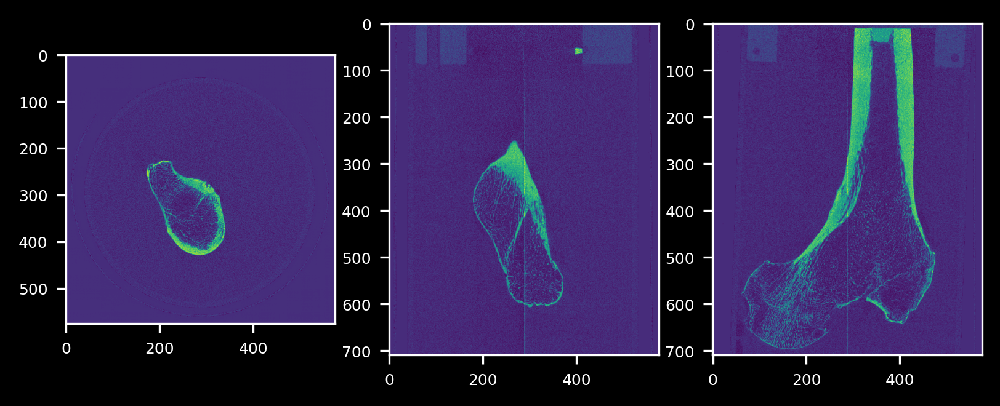

In [16]:
plot_midplanes_sitk(data_3D_res)

#### Read coordinates of cement markers
Read study master table

In [17]:
master = pd.read_csv(master_filename, sep=',') # names=column_names, dtype=float

In [18]:
master.head()

,$specimen,$donor,$site,$config,$mechtest,$sex,$age,$side,$h_sample,$femurh,...,$aBMDinter,$Aneck,$BMCneck,$aBMDneck,$Awards,$BMCwards,$aBMDwards,$aBMDtot,$BMCtot,$Atot
0,1955_L_S,1955,femur_prox,STANCE,1,m,88,LEFT,170.570,51,...,0.805222,7.277173,3.807238,0.523175,1.170454,0.325666,0.278239,0.739938,40.200399,54.329436
1,1955_R_F,1955,femur_prox,FALL,1,m,88,RIGHT,166.132,51,...,0.804763,8.223714,4.365356,0.530825,1.170454,0.311581,0.266206,0.733125,42.344845,57.759376
2,1956_L_S,1956,femur_prox,STANCE,0,m,82,LEFT,153.514,43,...,0.609684,6.127074,2.165871,0.353492,1.109387,0.143702,0.129533,0.491730,20.849834,42.400980
3,1956_R_S,1956,femur_prox,STANCE,0,m,82,RIGHT,157.494,43,...,0.634896,6.004940,2.391120,0.398192,1.027964,0.186689,0.181610,0.528859,23.608342,44.640110
4,1958_L_F,1958,femur_prox,FALL,1,w,80,LEFT,159.090,45,...,0.733025,5.200888,2.273541,0.437145,1.262055,0.548343,0.434484,0.605319,25.986485,42.930229


In [19]:
specimen_master = master[master['$specimen'].str.contains(specimen) & master['$site'].str.contains('femur_prox')]

In [20]:
specimen_master.head()

,$specimen,$donor,$site,$config,$mechtest,$sex,$age,$side,$h_sample,$femurh,...,$aBMDinter,$Aneck,$BMCneck,$aBMDneck,$Awards,$BMCwards,$aBMDwards,$aBMDtot,$BMCtot,$Atot
38,2019_L_S,2019,femur_prox,STANCE,1,m,94,LEFT,166.33,46,...,0.672883,6.401876,2.583935,0.403621,1.089031,0.399235,0.366597,0.626809,32.842073,52.395642


In [21]:
markers_coordinates_HR = np.array([[specimen_master['$M1x'].iloc[0], specimen_master['$M1y'].iloc[0], specimen_master['$M1z'].iloc[0]],
                                  [specimen_master['$M2x'].iloc[0], specimen_master['$M2y'].iloc[0], specimen_master['$M2z'].iloc[0]],
                                  [specimen_master['$M3x'].iloc[0], specimen_master['$M3y'].iloc[0], specimen_master['$M3z'].iloc[0]],
                                  [specimen_master['$M4x'].iloc[0], specimen_master['$M4y'].iloc[0], specimen_master['$M4z'].iloc[0]],
                                  [specimen_master['$M5x'].iloc[0], specimen_master['$M5y'].iloc[0], specimen_master['$M5z'].iloc[0]]])

In [22]:
print(markers_coordinates_HR)

[[ 95.189 101.349  14.088]
 [ 97.79   71.475  13.904]
 [ 41.58   66.536  13.816]
 [ 38.808  96.226  14.028]
 [ 95.934  93.435  13.657]]


Check correct position of markers coordinates

In [18]:
markers_slice = int(np.mean(markers_coordinates_HR[:,2])/(1e-3*data_3D_res.GetSpacing()[2]))
markers_pixel = (markers_coordinates_HR / (1e-3*np.array(data_3D_res.GetSpacing()))).astype('uint')

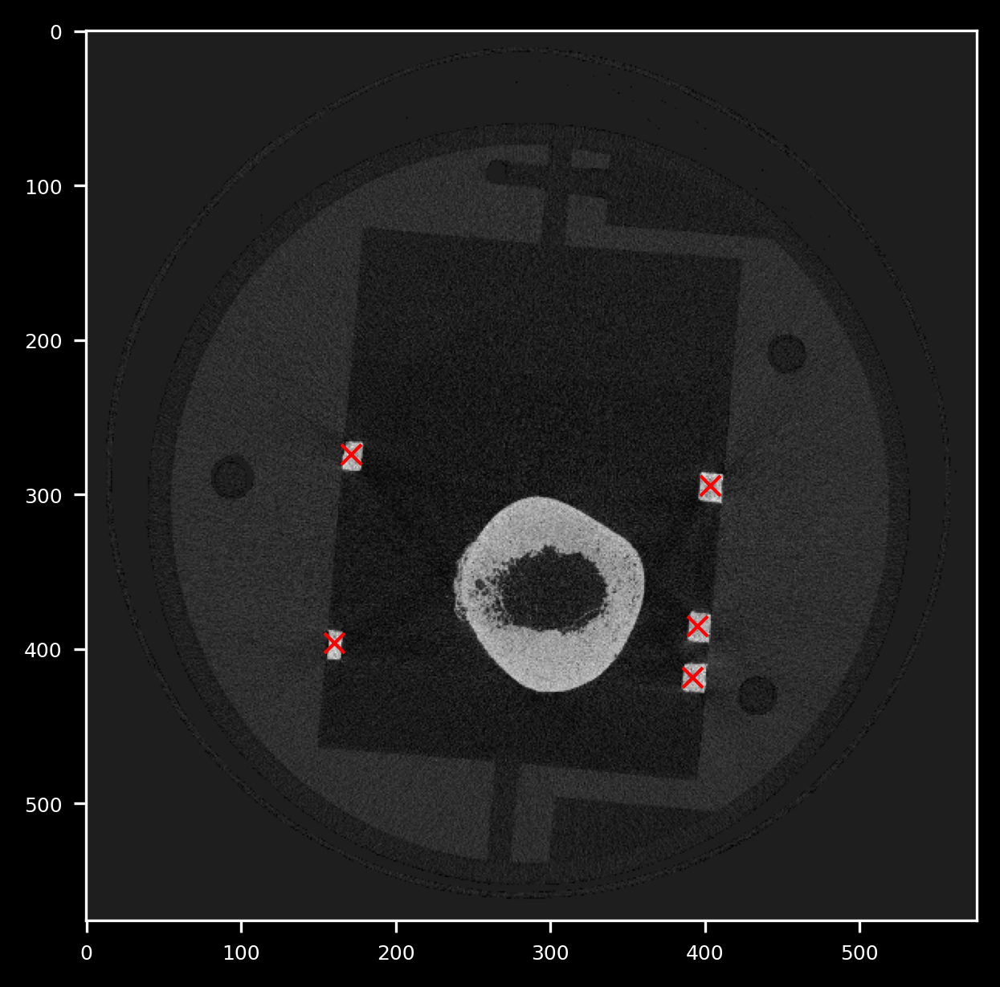

In [19]:
plt.imshow(sitk.GetArrayFromImage(data_3D_res)[markers_slice,:,:], cmap='grey')
plt.plot(markers_pixel[:,0], markers_pixel[:,1], 'xr')

### Read and inspect QCT input data
#### original QCT DICOM dataset

In [ ]:
# read QCT DICOM dataset
reader = sitk.ImageSeriesReader()

dicom_names = reader.GetGDCMSeriesFileNames(input_dir_QCT_DCM)
reader.SetFileNames(dicom_names)

data_3D_QCT = reader.Execute()

#### `.mhd` file fixed with 3Dslicer

In [24]:
data_3D_QCT = sitk.ReadImage(input_file_QCT_fixed, imageIO="MetaImageIO")

In [25]:
size_QCT = data_3D_QCT.GetSize()
print("Image size:", size_QCT[0], size_QCT[1], size_QCT[2])
vs_QCT = data_3D_QCT.GetSpacing() # it's a tuple
print("Image spacing:", vs_QCT[0], vs_QCT[1], vs_QCT[2])
dimension = data_3D_QCT.GetDimension()
print("Dimension: ", dimension)

Image size: 512 512 630
Image spacing: 0.29296875000000006 0.29296875000000006 0.3033386327503974
Dimension:  3


Inspect dataset

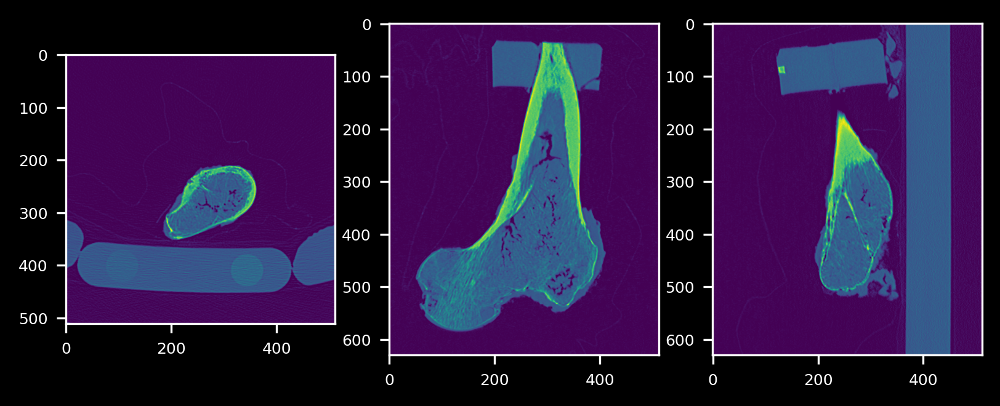

In [ ]:
plot_midplanes_sitk(data_3D_QCT)

### Resample dataset to isotropic voxel size

In [28]:
# vs_QCT_new = np.array(vs_QCT)*2 # downsample with factor 2 (non isotropic!)
vs_QCT_new = np.min(vs_QCT) * np.ones([3]) # keep spacing close to the origingal one but isotropic
print(vs_QCT_new)

[0.29296875 0.29296875 0.29296875]


In [29]:
data_3D_QCT_res = resample_img(data_3D_QCT, out_spacing=vs_QCT_new)

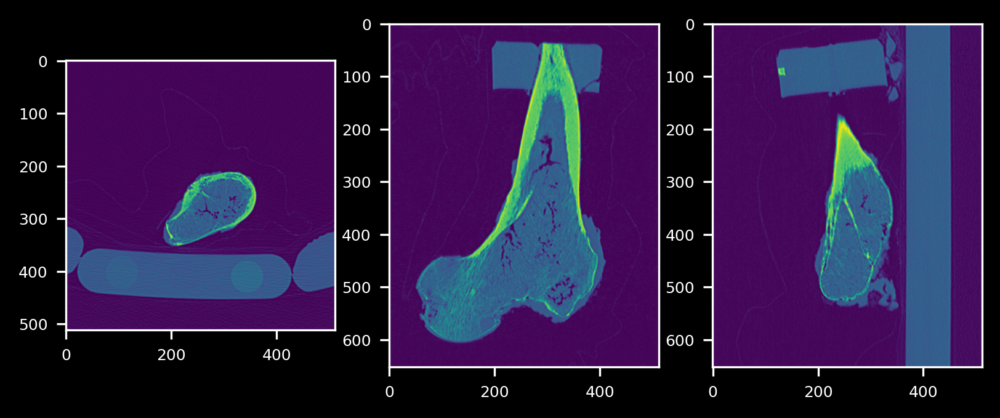

In [30]:
plot_midplanes_sitk(data_3D_QCT_res)

### Median filter
We create a filtered copy of the QCT dataset for segmentation of bone compartments

In [31]:
filter = sitk.MedianImageFilter()
filter.SetRadius(1)
data_3D_QCT_med = filter.Execute(data_3D_QCT_res)

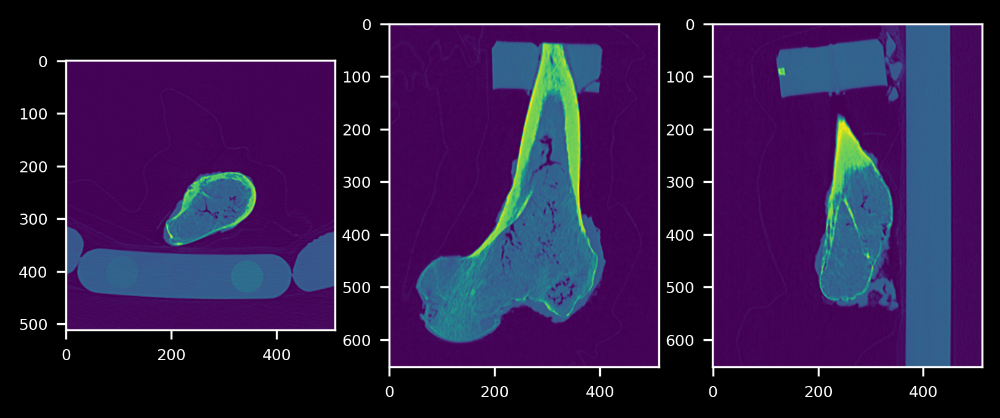

In [32]:
plot_midplanes_sitk(data_3D_QCT_med)

### Find cement markers
#### Segment markers and bone with multi otsu threshold
Multi-Otsu threshold of QCT dataset: 3 materials (backgroud, water, bone)

In [33]:
ts = threshold_multiotsu(sitk.GetArrayFromImage(data_3D_QCT_med))

Segment and perform image opening step to remove spurious voxels

In [34]:
data_3D_QCT_BW = morphology.binary_opening(sitk.GetArrayFromImage(data_3D_QCT_med) > ts[1])

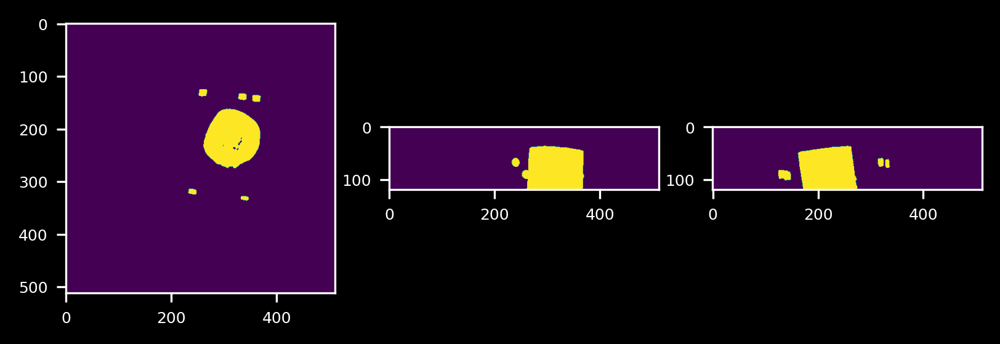

In [35]:
plot_projections(data_3D_QCT_BW[0:120,:,:])

#### Calculate markers coordinates
- QCT dataset:

In [36]:
markers_coordinates = markers_coors(data_3D_QCT_BW[0:120,:,:]) # [z, y, x]
# multiply by voxelsize and flip
markers_coordinates = np.fliplr(markers_coordinates*data_3D_QCT_med.GetSpacing()) # [x, y, z]
print(markers_coordinates)

[[105.80471463  41.55843099  27.41550022]
 [ 76.06176769  38.38775648  26.5943001 ]
 [ 70.25288015  93.48073766  19.92700549]
 [ 99.33822058  97.15045474  20.62579751]
 [ 98.04740339  40.61198237  26.78841114]]


#### Check markers positions

In [37]:
print(data_3D_QCT_med.GetSpacing())

(0.29296875000000006, 0.29296875000000006, 0.29296875000000006)


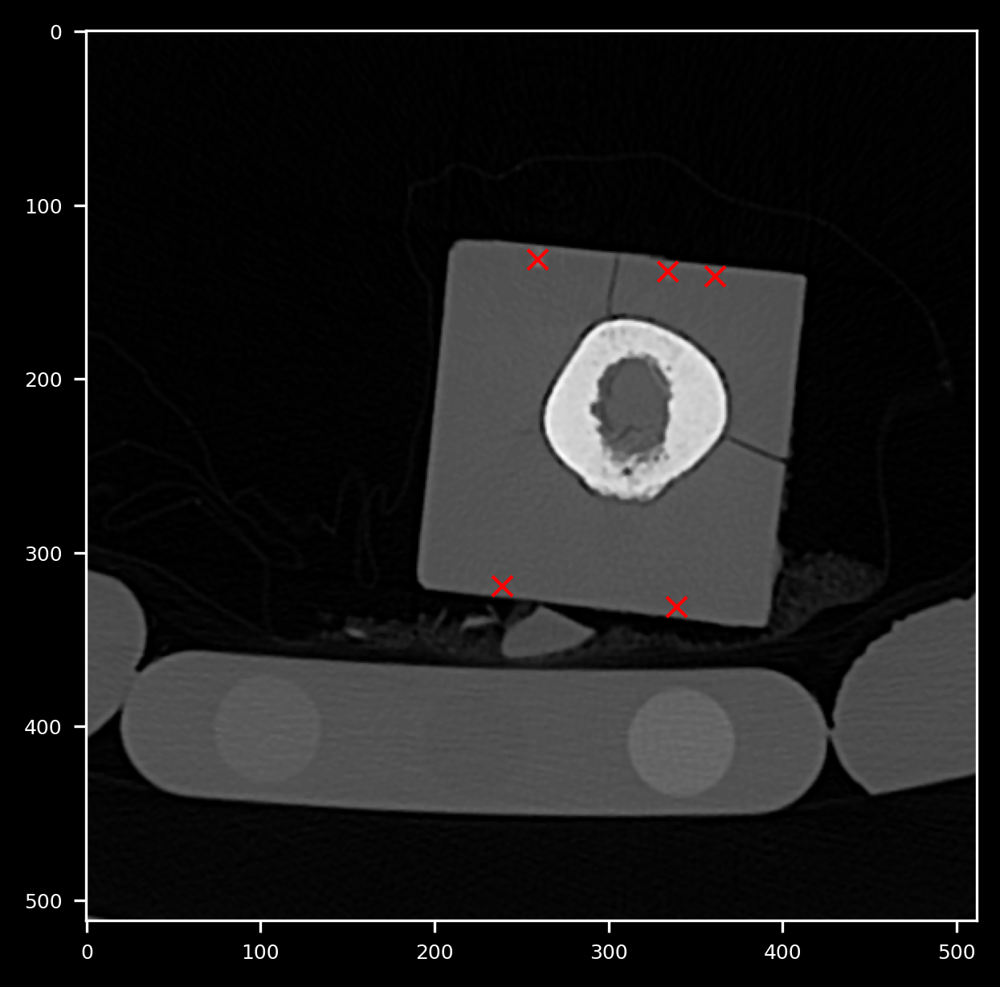

In [38]:
markers_slice = int(np.mean(markers_coordinates[:,2])/(data_3D_QCT_med.GetSpacing()[2]))
markers_pixel = (markers_coordinates / (np.array(data_3D_QCT_med.GetSpacing()))).astype('uint')

plt.imshow(sitk.GetArrayFromImage(data_3D_QCT_med)[markers_slice,:,:], cmap='grey')
plt.plot(markers_pixel[:,0], markers_pixel[:,1], 'xr')

###  Alignment and registration rotation matrices
Get n12, n14, v12, and v14 vectors

In [39]:
n12 = markers_coordinates[1,:] - markers_coordinates[0,:]
n14 = markers_coordinates[3,:] - markers_coordinates[0,:]

v12 = markers_coordinates_HR[1,:] - markers_coordinates_HR[0,:]
v14 = markers_coordinates_HR[3,:] - markers_coordinates_HR[0,:]

#### Rotation matrix to allign QCT markers with X-Y plane

In [62]:
# R_xy = align_with_XYplane(n12, n14)
# print(R_xy)

#### Rotation matrix to allign QCT markers with HR-pQCT markers

In [40]:
R_HR = align_with_vectors(n12, n14, v12, v14)
print(R_HR)

Angle between n12 and n14: 89.2648620715511 deg
Angle between v12 and v14: 89.78371605085269 deg
[[ 0.02442869 -0.99283321  0.11698484]
 [ 0.99909305  0.02832844  0.03178946]
 [-0.03487563  0.11610217  0.99262479]]


Store transformation matrix

In [41]:
output_R_HR = os.path.join(data_dir, 'QCT', ('QCTFEMUR_' + specimen.replace("_", "")), (specimen + '_R_HR.npy'))
print(output_R_HR)
np.save(output_R_HR, R_HR)

/usr/terminus/data-xrm-01/stamplab/external/tacosound/QCT/QCTFEMUR_2019L/2019_L_R_HR.npy


### Apply affine transformation to QCT stack

Apply the transformation matrix to the markers coordinates

In [42]:
print(markers_coordinates)

[[105.80471463  41.55843099  27.41550022]
 [ 76.06176769  38.38775648  26.5943001 ]
 [ 70.25288015  93.48073766  19.92700549]
 [ 99.33822058  97.15045474  20.62579751]
 [ 98.04740339  40.61198237  26.78841114]]


In [43]:
markers_coordinates_trans = np.matmul(markers_coordinates, R_HR)
print(markers_coordinates_trans)

[[  43.14927701 -100.68615014   40.91197305]
 [  39.28353687  -71.34152798   36.51656153]
 [  94.41717429  -64.78766062   30.97026416]
 [  98.76970899  -93.47946394   35.18310468]
 [  42.03605597  -93.08405173   39.35193398]]


In [44]:
print(markers_coordinates_HR)

[[ 95.189 101.349  14.088]
 [ 97.79   71.475  13.904]
 [ 41.58   66.536  13.816]
 [ 38.808  96.226  14.028]
 [ 95.934  93.435  13.657]]


#### Transform dataset - align with HR-pQCT dataset
Apply the same transformation to:
1. data_3D_QCT     - QCT dataset
2. data_3D_QCT_med - median resampled version of QCT (for binary compartment masks calculation)

In [45]:
data_3D_QCT_trans = affine_trans(data_3D_QCT, tmatrix=R_HR) # R_1rot

In [46]:
print(data_3D_QCT_trans.GetSpacing())

(0.29296875000000006, 0.29296875000000006, 0.3033386327503974)


In [57]:
data_3D_QCT_med = affine_trans(data_3D_QCT_med, tmatrix=R_HR) # R_1rot

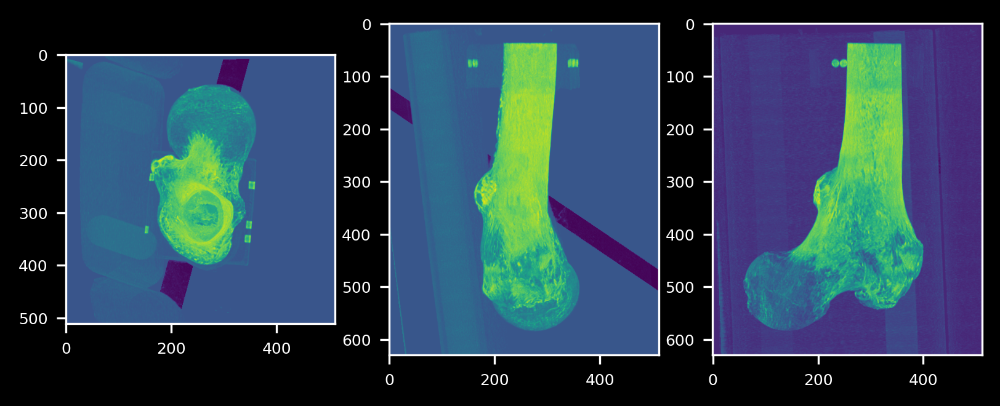

In [47]:
plot_projections_sitk(data_3D_QCT_trans)
# plot_projections_sitk(data_3D_QCT_med)

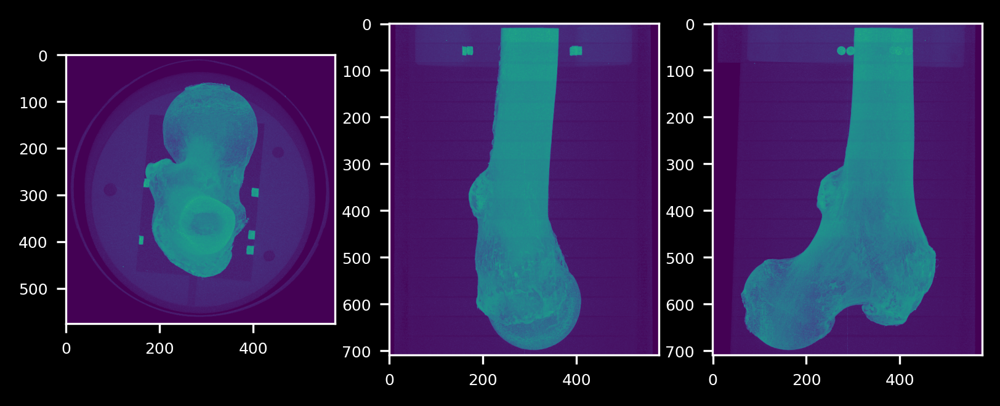

In [48]:
plot_projections_sitk(data_3D_res)

#### Recalculate markers coordinates on transformed QCT image

In [58]:
data_3D_QCT_BW_trans = morphology.binary_opening(sitk.GetArrayFromImage(data_3D_QCT_med) > ts[1])

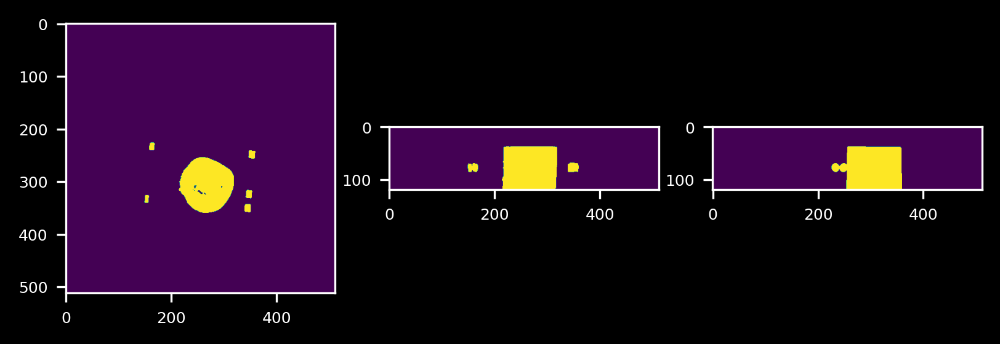

In [59]:
plot_projections(data_3D_QCT_BW_trans[0:120,:,:])

In [60]:
markers_coordinates_trans = markers_coors(data_3D_QCT_BW_trans[0:120,:,:]) # [z, y, x]
# multiply by voxelsize and flip
markers_coordinates_trans = np.fliplr(markers_coordinates_trans*data_3D_QCT_med.GetSpacing()) # [x, y, z]
print(markers_coordinates_trans)

[[100.97647149 102.67353324  22.95736436]
 [103.29721007  72.80227144  22.80963424]
 [ 47.69997058  68.35277897  22.78939639]
 [ 44.84479437  97.60044643  22.89972815]
 [101.66658727  94.87071265  22.49885671]]


Check correct position of markers coordinates on transformed image

In [64]:
markers_slice_trans = int(np.mean(markers_coordinates_trans[:,2])/data_3D_QCT_med.GetSpacing()[2])
markers_pixel_trans = (markers_coordinates_trans / data_3D_QCT_med.GetSpacing()).astype('uint')

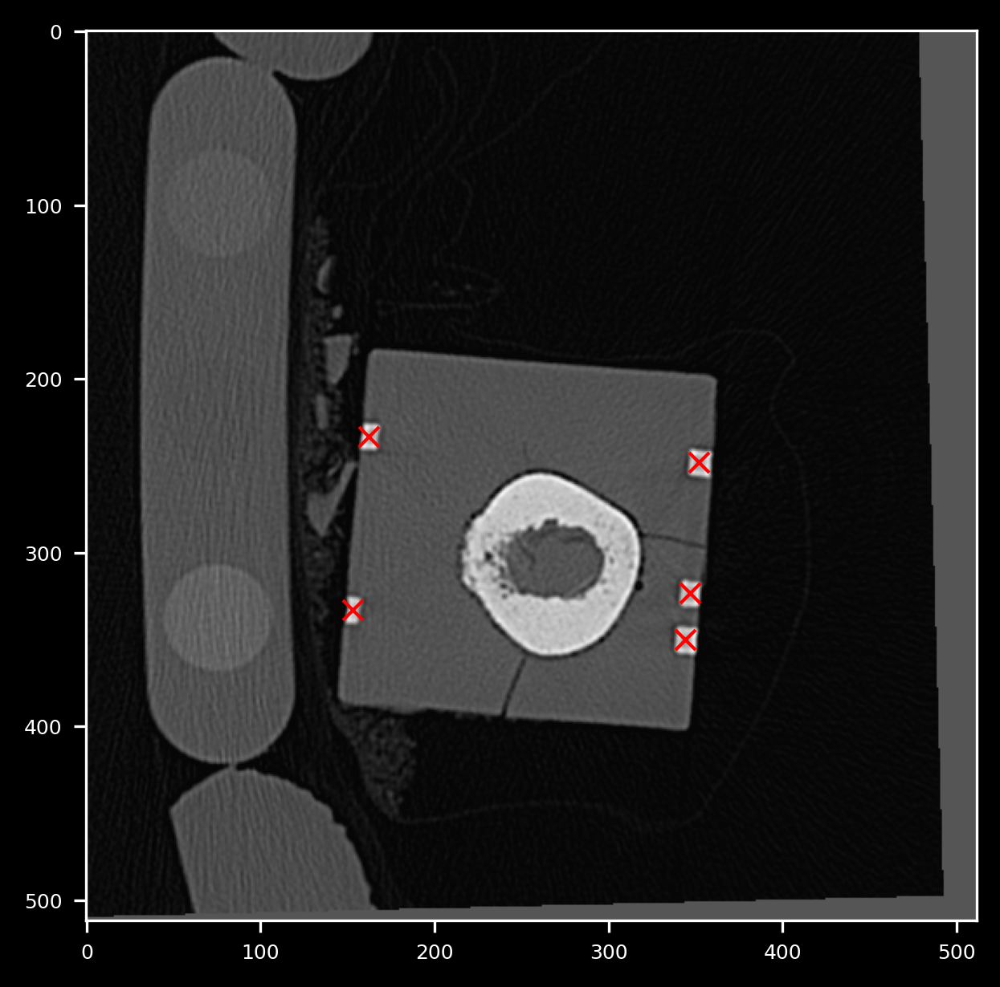

In [65]:
plt.imshow(sitk.GetArrayFromImage(data_3D_QCT_trans)[markers_slice_trans,:,:], cmap='grey')
plt.plot(markers_pixel_trans[:,0], markers_pixel_trans[:,1], 'xr')

#### Get offset between HR-pQCT and transformed QCT images

In [66]:
Offset_HR_QCTtrans = np.mean(markers_coordinates_HR - markers_coordinates_trans, axis=0)
print(Offset_HR_QCTtrans)

[-5.83680676 -1.45574855 -8.89239597]


#### Fix QCT transformed image origin to include the offset

In [68]:
print('QCT transformed:')
print('Origin: ', data_3D_QCT_trans.GetOrigin())
print('Spacing: ', data_3D_QCT_trans.GetSpacing())

print('HR res:')
print('Origin: ', data_3D_res.GetOrigin())
print('Spacing: ', data_3D_res.GetSpacing())


QCT transformed:
Origin:  (-77.85351562499999, -153.85351562499997, -1628.8)
Spacing:  (0.29296875000000006, 0.29296875000000006, 0.3033386327503974)
HR res:
Origin:  (0.0, 0.0, 12791.0)
Spacing:  (242.39930556, 242.39930556, 240.0)


In [69]:
data_3D_QCT_trans.SetOrigin(data_3D_QCT_trans.GetOrigin()+Offset_HR_QCTtrans)
# data_3D_QCT_med.SetOrigin(data_3D_QCT_med.GetOrigin()+Offset_HR_QCTtrans)

#### Set origin to zero and add the offset to HR markers

In [70]:
data_3D_QCT_trans.SetOrigin(Offset_HR_QCTtrans)

#### Write transformed dataset as single MHD file

In [73]:
# output_QCT_R_HR = os.path.join(data_dir, 'QCT/QCTFEMUR_1955L/QCTFEMUR_1955L_R_HR.mhd')
output_QCT_R_HR = os.path.join(data_dir, 'QCT', ('QCTFEMUR_' + specimen.replace("_", "")), (specimen + '_R_HR.mhd'))
print(output_QCT_R_HR)


/usr/terminus/data-xrm-01/stamplab/external/tacosound/QCT/QCTFEMUR_2019L/2019_L_R_HR.mhd


In [74]:
writer = sitk.ImageFileWriter()
writer.SetFileName(output_QCT_R_HR)
writer.Execute(data_3D_QCT_trans)

#### Write resampled HR dataset as MHD file

In [84]:
data_3D_res.SetOrigin([0.0, 0.0, 0.0])
data_3D_res.SetSpacing(1e-3 * np.array(data_3D_res.GetSpacing()))


In [87]:
output_file_HR_res = os.path.join(data_dir, 'HR-pQCT_II/00_resampled_data', specimen, (isqname + '_processed2.mhd'))
print(output_file_HR_res)

/usr/terminus/data-xrm-01/stamplab/external/tacosound/HR-pQCT_II/00_resampled_data/2019_L/C0001524_processed2.mhd


In [88]:
writer = sitk.ImageFileWriter()
writer.SetFileName(output_file_HR_res)
writer.Execute(data_3D_res)

## Elastix affine registration

`/home/giiori/myterminus/software/elastix5.1/bin/elastix -f /home/giiori/terminus/external/tacosound/HR-pQCT_II/00_resampled_data/2019_L/C0001524_processed2.mhd -m /home/giiori/terminus/external/tacosound/QCT/QCTFEMUR_2019L/2019_L_R_HR.mhd -out /home/giiori/terminus/external/tacosound/QCT/QCTFEMUR_2019L/ -p /home/giiori/myterminus/code/pyfabric/elastix/Parameters.Par0015.expC.phantom.NC.affine.txt`

Read again the transformed QCT dataset

In [32]:
data_3D_QCT_trans = sitk.ReadImage(output_QCT_R_HR, imageIO="MetaImageIO")

## Bone compartments masks
### Whole bone mask (periosteum mask)

In [305]:
# data_3D_BW_peri = periosteummask(data_3D>(ts_HR[1]-1000), closepixels=10, closevoxels=10, remove_objects_smaller_than=1, removeunconn=True, verbose=True)
data_3D_QCT_BW_peri = periosteummask(sitk.GetArrayFromImage(data_3D_QCT_med)>(ts[1]-400), closepixels=5, closevoxels=5, remove_objects_smaller_than=1, removeunconn=True, verbose=True)

INFO:root:Preliminary removal of objects smaller than 1 pixels.
INFO:root:2D slice-wise image closing and filling.
 Structuring element DISK of radius: 5
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 330/330 [00:01<00:00, 177.53it/s]
INFO:root:Removing isolated clusters of voxels.
INFO:root:Final 3D image closing.
 Structuring element CUBE of radius: 5


Assign to a new itk image

In [306]:
data_3D_QCT_BW_peri = sitk.GetImageFromArray(data_3D_QCT_BW_peri.astype('uint8'))
data_3D_QCT_BW_peri.CopyInformation(data_3D_QCT_med)

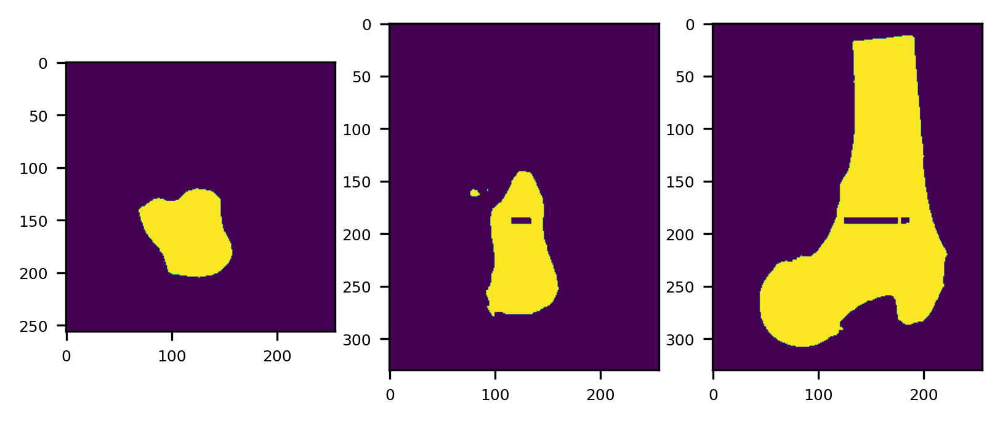

In [307]:
# plot_midplanes_sitk(data_3D_QCT_med>(ts[1])-500)
plot_midplanes_sitk(data_3D_QCT_BW_peri)

### Iterative Voting Hole Filling Filter
Performs the filling operation multiple times until no pixels change, or maximum number of iterations is reached.

In [308]:
hole_filling_filter = sitk.VotingBinaryIterativeHoleFillingImageFilter()
hole_filling_filter.SetRadius(3)
hole_filling_filter.SetMajorityThreshold(1)
hole_filling_filter.SetBackgroundValue(0)
hole_filling_filter.SetForegroundValue(1)
hole_filled_image = hole_filling_filter.Execute(data_3D_QCT_BW_peri)

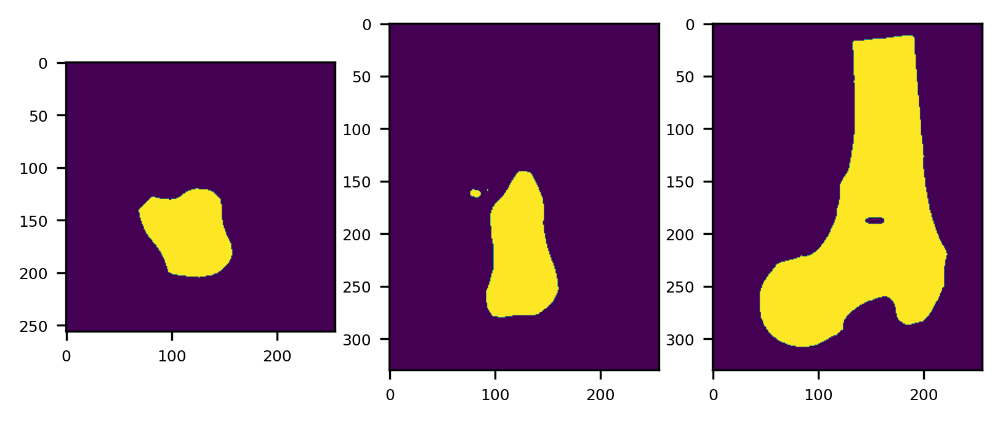

In [309]:
plot_midplanes_sitk(hole_filled_image)

### Image close

In [310]:
closing_filter = sitk.BinaryMorphologicalClosingImageFilter()
closing_filter.SetKernelRadius(8)
data_3D_QCT_BW_peri = closing_filter.Execute(hole_filled_image)

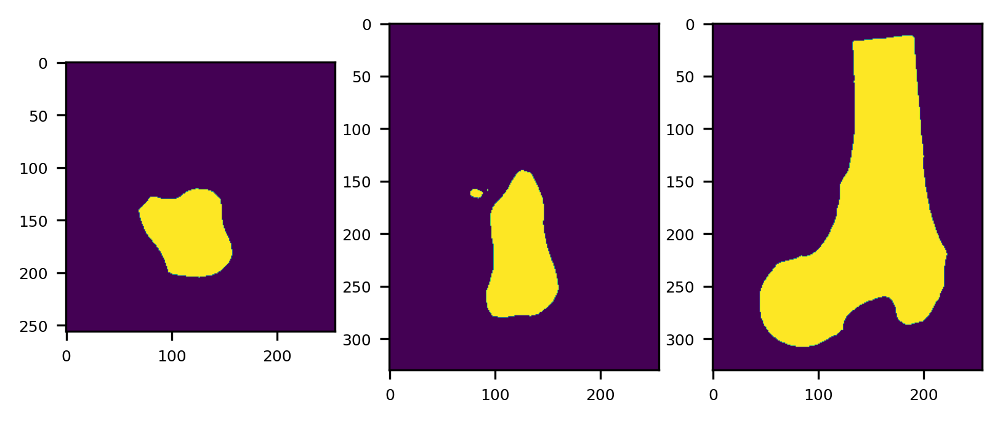

In [311]:
plot_midplanes_sitk(data_3D_QCT_BW_peri)

#### Write whole bone mask

In [312]:
output_QCT_R_HR_whole_bone = os.path.join(data_dir, 'QCT/QCTFEMUR_1955L/masks/QCTFEMUR_1955L_R_HR_whole_bone.mhd')

writer = sitk.ImageFileWriter()
writer.SetFileName(output_QCT_R_HR_whole_bone)
writer.Execute(data_3D_QCT_BW_peri)

### Trabecular bone mask
We erode 5 mm from the surface of the whole bone mask to obtain a tentative mesh of the trabecular core

In [319]:
offset_from_cortex = 5 # mm
kernel_radius = int(offset_from_cortex / data_3D_QCT_BW_peri.GetSpacing()[0])

In [320]:
erode_filter = sitk.BinaryErodeImageFilter()
erode_filter.SetKernelRadius(kernel_radius)
data_3D_BW_trab = erode_filter.Execute(data_3D_QCT_BW_peri)

Delete shaft portion from mask: this is done to remove thin struts and facilitate meshing

In [321]:
tmp = sitk.GetArrayFromImage(data_3D_BW_trab).astype('uint8')
tmp[0:100, :, :] = 0
data_3D_BW_trab = sitk.GetImageFromArray(tmp)
data_3D_BW_trab.CopyInformation(data_3D_QCT_BW_peri)

In [1]:
# myshow(sitk.LabelOverlay(data_3D_QCT, data_3D_BW_trab))

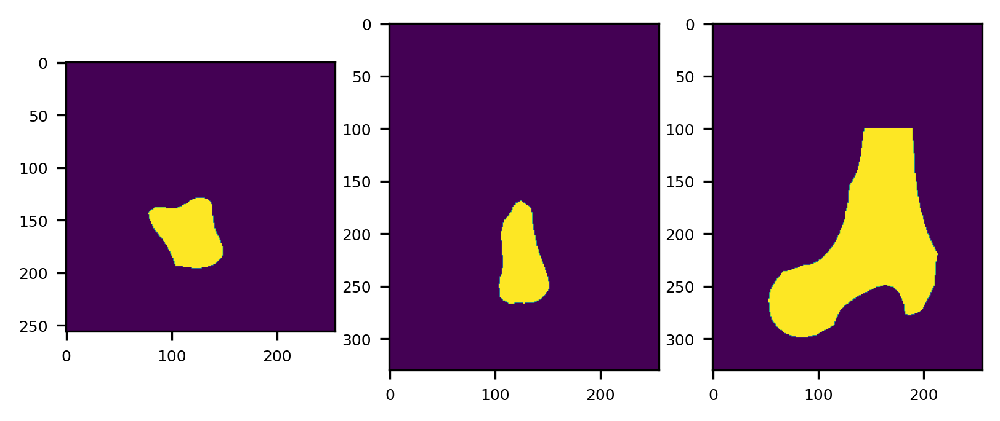

In [322]:
plot_midplanes_sitk(data_3D_BW_trab)

#### Write trabecular core mask

In [324]:
output_QCT_R_HR_trab = os.path.join(data_dir, 'QCT/QCTFEMUR_1955L/masks/QCTFEMUR_1955L_R_HR_trab.mhd')

writer = sitk.ImageFileWriter()
writer.SetFileName(output_QCT_R_HR_trab)
writer.Execute(data_3D_BW_trab)

## Mesh of trabecular core
Create tetrahedra mesh of trabecular core: volume meshing is done using [CGAL](https://www.cgal.org/) through [pygalmesh](https://github.com/nschloe/pygalmesh)

In [ ]:
import pygalmesh

In [35]:
# mesh_trab = pygalmesh.generate_from_array(np.transpose(data_3D_BW_trab, [2, 1, 0]).astype('uint8'),
#                                           tuple(vs),
#                                           max_facet_distance=size_f*min(vs),
#                                           max_cell_circumradius=3*size_f*min(vs)
#                                          )

In [208]:
# min_facet_angle=20,  lloyd=True,
size_f = 4 # size factor
mesh_trab = pygalmesh.generate_from_array(np.transpose(sitk.GetArrayFromImage(data_3D_BW_trab), [2, 1, 0]),
                                          data_3D_BW_trab.GetSpacing(),
                                          max_facet_distance=size_f*min(data_3D_BW_trab.GetSpacing()),
                                          max_cell_circumradius=3*size_f*min(data_3D_BW_trab.GetSpacing())
                                         )

construct initial points (nb_points: 12)
12/12 initial point(s) found...
Start surface scan...Scanning triangulation for bad facets (sequential) - number of finite facets = 52...
Number of bad facets: 12
scanning edges (lazy)
scanning vertices (lazy)
end scan. [Bad facets:12]

Refining Surface...
Legend of the following line: (#vertices,#steps,#facets to refine,#tets to refine)
(60,47,0,0) (9627.5 vertices/s))
Total refining surface time: 0.00490308s

Start volume scan...Scanning triangulation for bad cells (sequential)... 255 cells scanned, done.
Number of bad cells: 100
end scan. [Bad tets:100]

Refining...
Legend of the following line: (#vertices,#steps,#facets to refine,#tets to refine)
(87,38,0,0) (13649.4 vertices/s))
Total refining volume time: 0.00280404s
Total refining time: 0.00829411s

Running sliver perturbation...
Legend of the following line: (#vertices in pqueue, #iterations, #fails)
bound 12: (8,5,0) (599.6 iteration/s))
Total perturbation time: 0.00835514s
Perturbation

Remove triangles

In [210]:
mesh_trab.remove_lower_dimensional_cells()

{'triangle'}

Write VTK mesh with [meshio](https://github.com/nschloe/meshio)

In [16]:
output_QCT_R_HR_mesh_trab = os.path.join(data_dir, 'QCT/QCTFEMUR_1955L/masks/QCTFEMUR_1955L_R_HR_trab_mesh_max_facet3mm_max_cell_circ9mm_noOrigin.vtk')
print(output_QCT_R_HR_mesh_trab)

/run/media/beatsbs/My Passport/Data/TacoSound/QCT/QCTFEMUR_1955L/masks/QCTFEMUR_1955L_R_HR_trab_mesh_max_facet3mm_max_cell_circ9mm.vtk


In [212]:
mesh_trab.write(output_QCT_R_HR_mesh_trab)

Reload the mesh (if you have already generated it and want to start the notebook from this point)

In [9]:
import meshio
mesh_trab = meshio.read(output_QCT_R_HR_mesh_trab)

### Get Barycenter of each cell of the trabecular core (QCT data)

In [217]:
# cells barycenter coordinates
cells_bary = np.sum(mesh_trab.points[mesh_trab.cells[0][1][:]], 1)/mesh_trab.points[mesh_trab.cells[0][1][:]].shape[1] # x, y, z

Save array of cells barycenters coordinates

In [328]:
# output_trab_cells_bary = os.path.join(data_dir, 'QCT/QCTFEMUR_1955L/masks/QCTFEMUR_1955L_R_HR_trab_mesh_barycenters_noOrigin.npy')
output_trab_cells_bary = os.path.join(data_dir, 'QCT/QCTFEMUR_1955L/masks/QCTFEMUR_1955L_R_HR_trab_mesh_barycenters.npy')

print(output_trab_cells_bary)

/run/media/beatsbs/My Passport/Data/TacoSound/QCT/QCTFEMUR_1955L/masks/QCTFEMUR_1955L_R_HR_trab_mesh_barycenters.npy


In [219]:
np.save(output_trab_cells_bary, cells_bary)

Reload it

In [329]:
cells_bary = np.load(output_trab_cells_bary)
print(cells_bary.shape)

(885, 3)


## Crop trabecular bone portions
--- testing ---

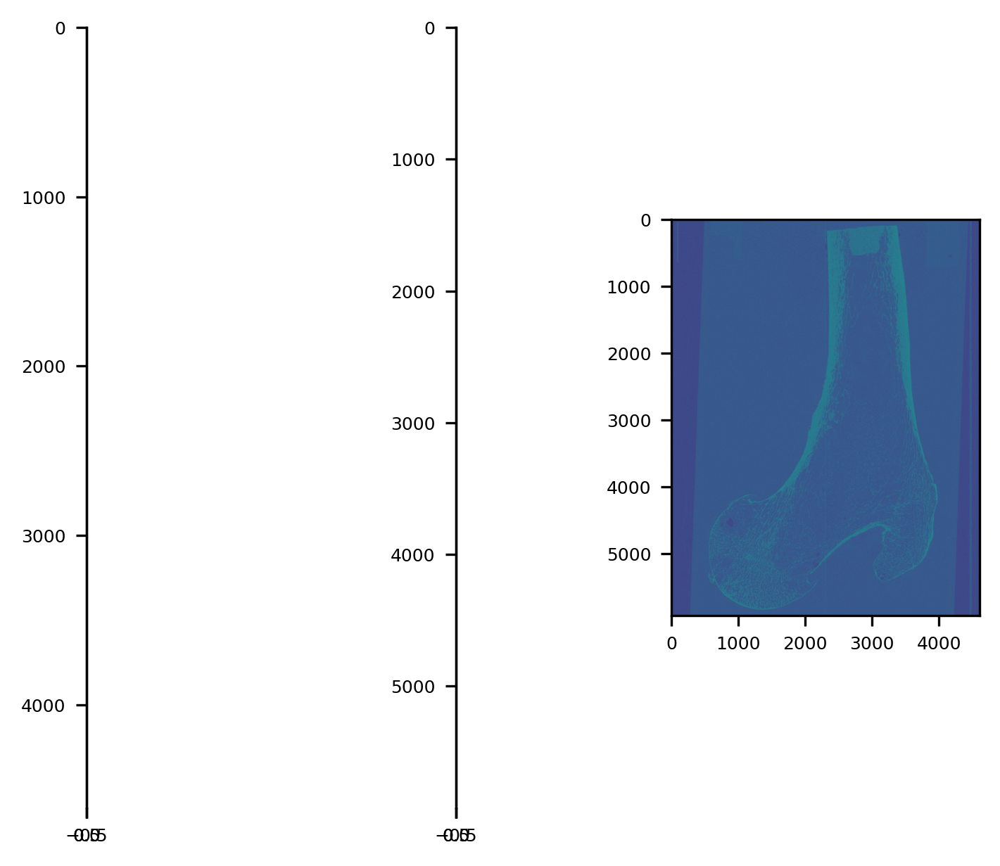

In [330]:
extract = sitk.ExtractImageFilter()
extract.SetSize([1, 4608, 5921])
extract.SetIndex([2304, 0, 0])
extracted_image = extract.Execute(data_3D)

plot_midplanes_sitk(extracted_image)

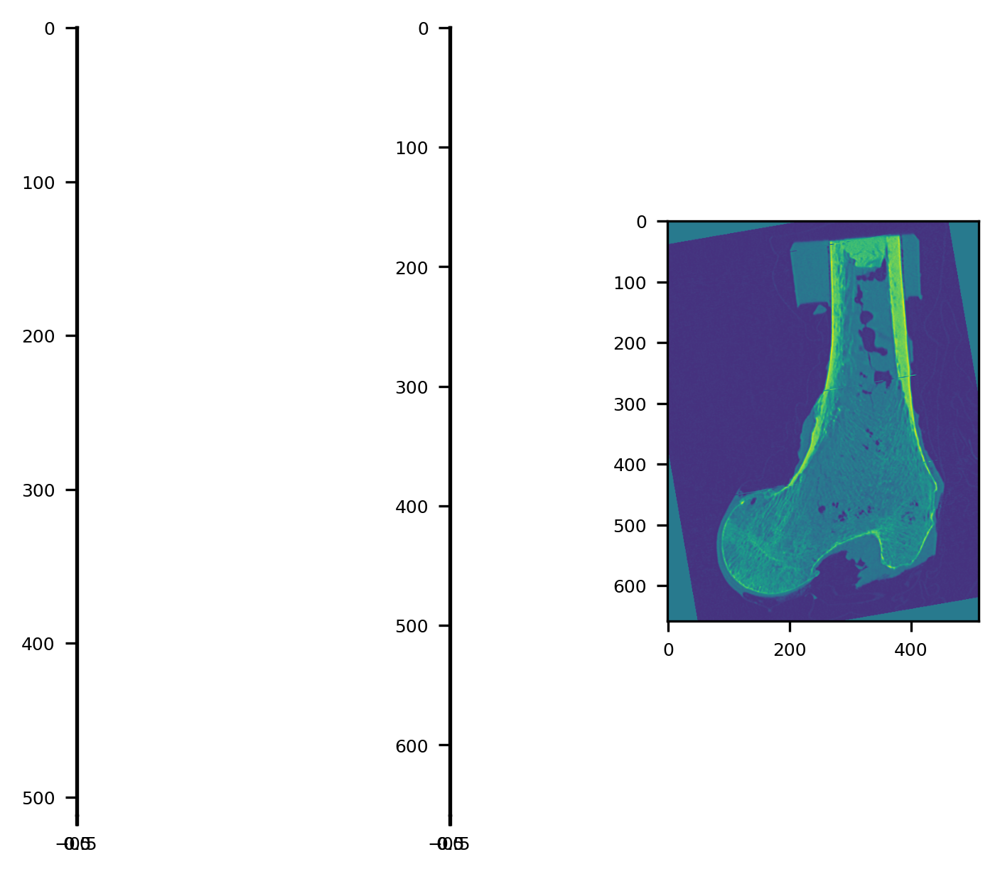

In [331]:
extract = sitk.ExtractImageFilter()
extract.SetSize([1, 512, 659])
extract.SetIndex([256, 0, 0])
extracted_image = extract.Execute(data_3D_QCT_trans)

plot_midplanes_sitk(extracted_image)

In [334]:
((cells_bary[id] - data_3D_QCT_trans.GetOrigin()) - size/2)/data_3D.GetSpacing()

array([1778.08852386, 3276.13692713, 3407.75766934])

In [340]:
data_3D_QCT_trans.GetOrigin()

(-80.430177348064, -176.09528479115204, -1688.4640107722537)

In [341]:
data_3D.GetOrigin()

(0.0, 0.0, 0.0)

In [342]:
Offset_HR_QCTtrans

array([ 1.42333828, -8.24176917, -5.06401077])

[2401 2232 2654]


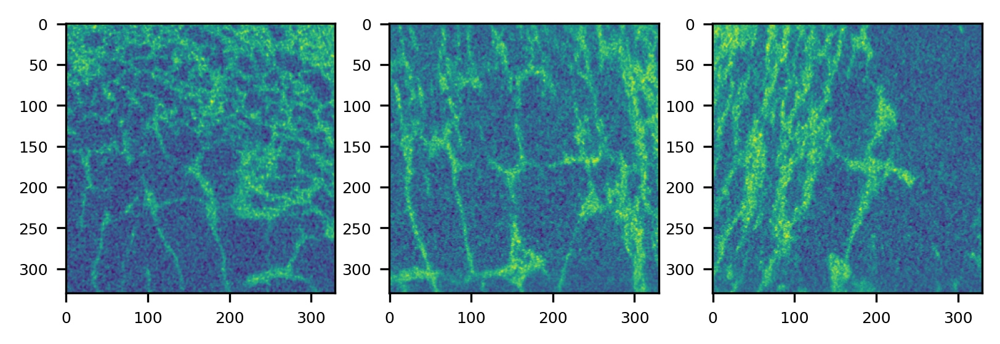

In [380]:
id = 65
size = np.array([5., 5., 5.]) # mm
size = np.array([10., 10., 10.]) # mm
# print(cells_bary[id])
# print(np.round((cells_bary[id] - size/2)/data_3D_BW_trab.GetSpacing()).astype('int'))
# print(np.round((cells_bary[id] + size/2)/data_3D_BW_trab.GetSpacing()).astype('int'))

# crop HR-pQCT data
crop_start = np.round((cells_bary[id] - data_3D_QCT_trans.GetOrigin() + Offset_HR_QCTtrans - size/2)/data_3D.GetSpacing()).astype('int')
crop_end = np.round((cells_bary[id] - data_3D_QCT_trans.GetOrigin() + Offset_HR_QCTtrans + size/2)/data_3D.GetSpacing()).astype('int')
# crop_start = np.round((cells_bary[id] - size/2)/data_3D.GetSpacing()).astype('int')
# crop_end = np.round((cells_bary[id] + size/2)/data_3D.GetSpacing()).astype('int')
crop_size = crop_end - crop_start

print(crop_start)

# Select same subregion using ExtractImageFilter
extract = sitk.ExtractImageFilter()
extract.SetSize(crop_size.tolist())
extract.SetIndex(crop_start.tolist())
extracted_image = extract.Execute(data_3D)

plot_midplanes_sitk(extracted_image)

[243 259 292]


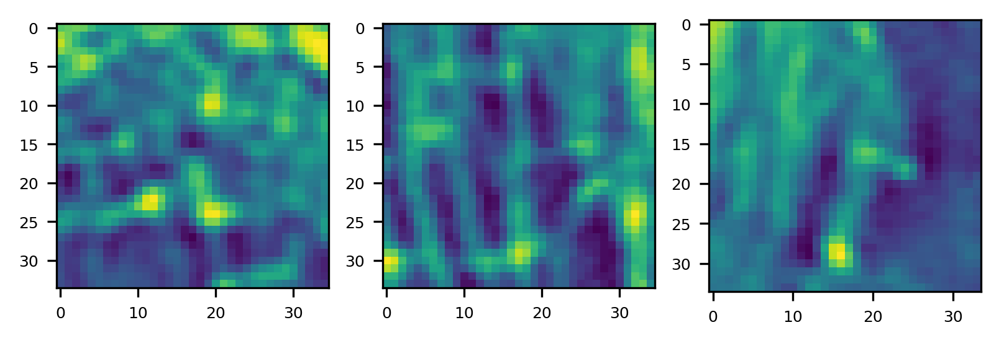

In [381]:
# crop QCT data
crop_start = np.round(((cells_bary[id] - data_3D_QCT_trans.GetOrigin()) - size/2)/data_3D_QCT_trans.GetSpacing()).astype('int')
crop_end = np.round(((cells_bary[id] - data_3D_QCT_trans.GetOrigin()) + size/2)/data_3D_QCT_trans.GetSpacing()).astype('int')

# crop_start = np.round((cells_bary[id] - size/2)/data_3D_QCT_trans.GetSpacing()).astype('int')
# crop_end = np.round((cells_bary[id] + size/2)/data_3D_QCT_trans.GetSpacing()).astype('int')
crop_size = crop_end - crop_start

print(crop_start)

# Select same subregion using ExtractImageFilter
extract = sitk.ExtractImageFilter()
extract.SetSize(crop_size.tolist())
extract.SetIndex(crop_start.tolist())
extracted_image_QCT = extract.Execute(data_3D_QCT_trans)

plot_midplanes_sitk(extracted_image_QCT)

In [ ]:
# crop QCT data
crop_start = np.round((cells_bary[id] - size/2)/data_3D_QCT.GetSpacing()).astype('int')
crop_end = np.round((cells_bary[id] + size/2)/data_3D_QCT.GetSpacing()).astype('int')
# crop_size = crop_end - crop_start

test_crop_QCT = sitk.GetArrayFromImage(data_3D_QCT)[crop_start[2]:crop_end[2],crop_start[1]:crop_end[1],crop_start[0]:crop_end[0]]
# print(test_crop_QCT.shape)

plot_midplanes(test_crop_QCT)

In [207]:
cells_bary[42]/data_3D_QCT.GetSpacing()

array([398.67054688, 249.76      , 393.87334532])

---
# scratch: